### How to work with scanpy objects and single-cell data
###### Cell Discovery Network at Boston Childrens Hospital
##### Author: Rose Hedderman  
###### Feb 12, 2024

#### Introduction  
In this vignette, we are going to use scanpy to analyze single-cell RNA data. 
Scanpy single-cell RNA objects are called AnnData objects and are comparable to Seurat objects in R. 

By the end of this vignette, we will have learned how to:
1. Learn the basics of Python and the [Scanpy library](https://scanpy.readthedocs.io/en/stable/index.html)
2. Understand the Anndata objects and its structure
3. Load and access metadata
4. Combine Anndata objects ?
5. Find the highly variable genes
6. Subset the data by cell type or another category
7. Visualize PCA and UMAP plots  

To do this analysis we will download two publicly available datasets from these papers:
- Data from the CZI cellxgene portal from the paper on [Local and systemic responses to SARS-CoV-2 infection in children and adults](https://www.nature.com/articles/s41586-021-04345-x)
- Data from the [Human Lung Cell Atlas](https://www.nature.com/articles/s41591-023-02327-2)

In [156]:
## TD
# 1 - Add more detail about the statistical methods used
# 2 - Is there a way to make this look more appealing? more photos or diagrams? or color or logos?
# 3 - Fix current images
# 4 - Give more detail on each step (e.g. "sc.pp vs sc.pl vs sc.tl") esp towards end of script

## Questions
# 1 - Marc has two datasets that he combines - should I combine these datasets? 
#     Or find publicly available datasets that are more similar to each other to do so? 
#     Or exhibit combining metadata from a different df using scanpy?

## Feedback?

##### Intro to Python  
A "!" is used in front of a statement in a Jupyter notebook whenever the statement is written for the terminal. "!" is a way of accessing the terminal from your notebook without having to leave your file.

In [5]:
# To know what folder you are working in
## pwd: present working directory
!pwd

In [6]:
# To list the files in the current directory
## ls: list files
!ls

In [ ]:
# To navigate to a different directory
## cd: change directory
!cd ./new-directory-name

##### Intro to Scanpy  
Scanpy is a python library (or python extension) built to help you analyze single-cell RNA seq data. It is the largest available library for coding in python and python is advantageous over R in:
- speed when analyzing really large datasets
- integration with other functions in Python
- scaling analysis to use other methods such as machine learning.

In [4]:
# To install scanpy: run this command once and then comment it out
# !pip install scanpy

In [16]:
# To access installed packages or refernce functions in other files in your current workspace, you can use the import command

import scanpy as sc     # scanpy for scRNA-seq analysis
import pandas as pd     # pandas for data frame building and manipulation
import os               # os for file navigation
import random           # random as a math function to set a random seed
import session_info     # session_info to record the session information

# Set seed to make the results reproducible
random.seed(123)

# Set basic settiings for scanpy figures
sc.settings.verbosity = 0
sc.settings.set_figure_params(
    dpi=80,
    facecolor="white",
    # color_map="YlGnBu",
    frameon=False,
)
# Reduce output by turning off warnings
import warnings
warnings.filterwarnings('ignore')

In [17]:
## Note: A common error message to receive when running the code is "ModuleNotFoundError: No module named 'scanpy'". 
# To install the package and fix this error, you can use the command !pip install scanpy or !conda install -c conda-forge scanpy.
# This goes for all packages, not just scanpy.

##### Load data
Two options to load data:
1. Download from these links.  
- Data used in Local and systemic responses to SARS-CoV-2 infection in children and adults paper: https://datasets.cellxgene.cziscience.com/623dee76-4a08-4c4a-8d5e-35ee933af164.h5ad  
- Portion of the integrated Human Lung Cell Atlas: https://datasets.cellxgene.cziscience.com/7a3f08f9-5d07-4ddd-a8fe-5967dd34f35f.h5ad   
*Note: If you download from these links, you'll need to move the data to your pwd.*

2. Uncomment and use the following commands to download from this notebook. The "-o" command sets the name of the output file so change that to what works for you.

In [20]:
# !curl https://datasets.cellxgene.cziscience.com/623dee76-4a08-4c4a-8d5e-35ee933af164.h5ad -o CZI.h5ad

In [21]:
# !curl https://datasets.cellxgene.cziscience.com/7a3f08f9-5d07-4ddd-a8fe-5967dd34f35f.h5ad -o HLCA.h5ad

##### Load data into scanpy objects called Anndata objects

In [23]:
# Read the data files into anndata objects
czi = sc.read_h5ad("./data/CZI.h5ad")
hlca = sc.read_h5ad("./data/HLCA.h5ad")

# Note: Scanpy has other built-in functions to load 10X data such as sc.read_10x_h5() and sc.read_10x_mtx().

In [24]:
# Use separate cells to visualize data from both sources
czi

AnnData object with n_obs × n_vars = 236977 × 33234
    obs: 'sample_id', 'donor_id', 'Group', 'Ethnicity_inferred', 'Smoker', 'COVID_status', 'COVID_severity', 'First_symptoms_hospitalisation_interval', 'First_symptoms_collection_interval', 'Positive_test_collection_interval', 'Kit_version', 'dataset', 'batch', 'Cell_type_annotation_level3', 'Cell_type_annotation_level1', 'Cell_type_annotation_level2', 'log1p_n_counts', 'log1p_n_genes', 'percent_mito', 'percent_ribo', 'n_counts_total_sarscov2', 'percent_total_sarscov2', 'n_counts_sarscov2', 'percent_sarscov2', 'scrublet_score', 'assay_ontology_term_id', 'cell_type_ontology_term_id', 'development_stage_ontology_term_id', 'disease_ontology_term_id', 'self_reported_ethnicity_ontology_term_id', 'is_primary_data', 'organism_ontology_term_id', 'sex_ontology_term_id', 'tissue_ontology_term_id', 'suspension_type', 'tissue_type', 'cell_type', 'assay', 'disease', 'organism', 'sex', 'tissue', 'self_reported_ethnicity', 'development_stage', 'obse

In [25]:
hlca

AnnData object with n_obs × n_vars = 584944 × 28024
    obs: 'suspension_type', 'donor_id', 'is_primary_data', 'assay_ontology_term_id', 'cell_type_ontology_term_id', 'development_stage_ontology_term_id', 'disease_ontology_term_id', 'self_reported_ethnicity_ontology_term_id', 'tissue_ontology_term_id', 'organism_ontology_term_id', 'sex_ontology_term_id', 'BMI', 'age_or_mean_of_age_range', 'age_range', 'anatomical_region_ccf_score', 'ann_coarse_for_GWAS_and_modeling', 'ann_finest_level', 'ann_level_1', 'ann_level_2', 'ann_level_3', 'ann_level_4', 'ann_level_5', 'cause_of_death', 'dataset', 'entropy_dataset_leiden_3', 'entropy_original_ann_level_1_leiden_3', 'entropy_original_ann_level_2_clean_leiden_3', 'entropy_original_ann_level_3_clean_leiden_3', 'entropy_subject_ID_leiden_3', 'fresh_or_frozen', 'leiden_1', 'leiden_2', 'leiden_3', 'leiden_4', 'leiden_5', 'log10_total_counts', 'lung_condition', 'mixed_ancestry', 'n_genes_detected', 'original_ann_highest_res', 'original_ann_level_1', '

##### But what is an Anndata object? and what does "n_obs x n_vars" mean ??
An Anndata object, often abbreviated to "adata", is a sparse matrix representing cells (observations) by genes (variables). In an adata object, cells are the columns and genes are the rows. The figure below can help visualize this concept.  

Additionally, the metadata (or extra information) associated with each cell or each gene is found in Series objects associated with the obs or vars such as czi.obs['Group] or hlca.var['feature_name']. It is important to label this information early in the analysis so the metadata is readily available for a subset of cells or genes you might want to inspect.  

<img src="https://raw.githubusercontent.com/scverse/anndata/main/docs/_static/img/anndata_schema.svg" width="500"/>
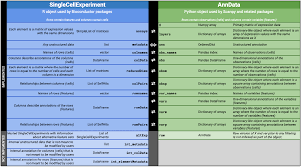  
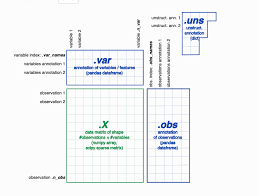


##### Accessing metadata
We'll look at the metadata for cells and genes for the CZI Anndata object. 

In [30]:
# Look at the first 5 observations in the CZI data
czi.obs[:5]

,sample_id,donor_id,Group,Ethnicity_inferred,Smoker,COVID_status,COVID_severity,First_symptoms_hospitalisation_interval,First_symptoms_collection_interval,Positive_test_collection_interval,...,tissue_type,cell_type,assay,disease,organism,sex,tissue,self_reported_ethnicity,development_stage,observation_joinid
index,,,,,,,,,,,,,,,,,,,,,
AAACCTGAGGAGTTGC-CV001_KM8853544-ucl,NP10-NB,NP10,Ped,EUR,Non-smoker,Healthy,None,NaN,NaN,NaN,...,tissue,tracheal goblet cell,10x 5' v1,normal,Homo sapiens,male,nasal cavity,European,2-5 year-old child stage,0^L|*uof7E
AAACCTGAGTGGGCTA-CV001_KM8853544-ucl,NP10-NB,NP10,Ped,EUR,Non-smoker,Healthy,None,NaN,NaN,NaN,...,tissue,memory B cell,10x 5' v1,normal,Homo sapiens,male,nasal cavity,European,2-5 year-old child stage,HyD-?8-g1f
AAACCTGCAAAGGCGT-CV001_KM8853544-ucl,NP10-NB,NP10,Ped,EUR,Non-smoker,Healthy,None,NaN,NaN,NaN,...,tissue,gamma-delta T cell,10x 5' v1,normal,Homo sapiens,male,nasal cavity,European,2-5 year-old child stage,gzV68unq^u
AAACCTGCAATGAAAC-CV001_KM8853544-ucl,NP10-NB,NP10,Ped,EUR,Non-smoker,Healthy,None,NaN,NaN,NaN,...,tissue,"CD8-positive, alpha-beta memory T cell",10x 5' v1,normal,Homo sapiens,male,nasal cavity,European,2-5 year-old child stage,f&-DIO<Zn`
AAACCTGCACTGTCGG-CV001_KM8853544-ucl,NP10-NB,NP10,Ped,EUR,Non-smoker,Healthy,None,NaN,NaN,NaN,...,tissue,tracheal goblet cell,10x 5' v1,normal,Homo sapiens,male,nasal cavity,European,2-5 year-old child stage,TX;8LQfj=L


In [53]:
# To list all possible metadata, I use the columns function
## NOTE: If you're using your own data, it's possible you won't have many or any columns in the obs or var attributes.
czi.obs.columns

Index(['sample_id', 'donor_id', 'Group', 'Ethnicity_inferred', 'Smoker',
       'COVID_status', 'COVID_severity',
       'First_symptoms_hospitalisation_interval',
       'First_symptoms_collection_interval',
       'Positive_test_collection_interval', 'Kit_version', 'dataset', 'batch',
       'Cell_type_annotation_level3', 'Cell_type_annotation_level1',
       'Cell_type_annotation_level2', 'log1p_n_counts', 'log1p_n_genes',
       'percent_mito', 'percent_ribo', 'n_counts_total_sarscov2',
       'percent_total_sarscov2', 'n_counts_sarscov2', 'percent_sarscov2',
       'scrublet_score', 'assay_ontology_term_id',
       'cell_type_ontology_term_id', 'development_stage_ontology_term_id',
       'disease_ontology_term_id', 'self_reported_ethnicity_ontology_term_id',
       'is_primary_data', 'organism_ontology_term_id', 'sex_ontology_term_id',
       'tissue_ontology_term_id', 'suspension_type', 'tissue_type',
       'cell_type', 'assay', 'disease', 'organism', 'sex', 'tissue',
       's

In [54]:
# Look at the first 5 variables in the CZI data
czi.var[:5]

,mito,ribo,sarscov2,gene_symbols,feature_is_filtered,feature_name,feature_reference,feature_biotype,feature_length
ENSG00000121410,False,False,False,A1BG,False,A1BG,NCBITaxon:9606,gene,3999
ENSG00000268895,False,False,False,A1BG-AS1,False,A1BG-AS1,NCBITaxon:9606,gene,3374
ENSG00000148584,False,False,False,A1CF,False,A1CF,NCBITaxon:9606,gene,9603
ENSG00000175899,False,False,False,A2M,False,A2M,NCBITaxon:9606,gene,6318
ENSG00000245105,False,False,False,A2M-AS1,False,A2M-AS1,NCBITaxon:9606,gene,2948


In [55]:
# List all possible metadata for the CZI data
czi.var.columns

## NOTE: The "var" attribute will contain gene expression data that we'll compute later so this list will get longer.

Index(['mito', 'ribo', 'sarscov2', 'gene_symbols', 'feature_is_filtered',
       'feature_name', 'feature_reference', 'feature_biotype',
       'feature_length'],
      dtype='object')

In [56]:
# Example of accessing a specific metadata column
czi.var["feature_name"][:5]

ENSG00000121410        A1BG
ENSG00000268895    A1BG-AS1
ENSG00000148584        A1CF
ENSG00000175899         A2M
ENSG00000245105     A2M-AS1
Name: feature_name, dtype: category
Categories (33234, object): ['A1BG', 'A1BG-AS1', 'A1CF', 'A2M', ..., 'ZZZ3', 'bP-21264C1.2', 'bP-2171C21.3', 'hsa-mir-1253']

In [57]:
czi.obs.columns

Index(['sample_id', 'donor_id', 'Group', 'Ethnicity_inferred', 'Smoker',
       'COVID_status', 'COVID_severity',
       'First_symptoms_hospitalisation_interval',
       'First_symptoms_collection_interval',
       'Positive_test_collection_interval', 'Kit_version', 'dataset', 'batch',
       'Cell_type_annotation_level3', 'Cell_type_annotation_level1',
       'Cell_type_annotation_level2', 'log1p_n_counts', 'log1p_n_genes',
       'percent_mito', 'percent_ribo', 'n_counts_total_sarscov2',
       'percent_total_sarscov2', 'n_counts_sarscov2', 'percent_sarscov2',
       'scrublet_score', 'assay_ontology_term_id',
       'cell_type_ontology_term_id', 'development_stage_ontology_term_id',
       'disease_ontology_term_id', 'self_reported_ethnicity_ontology_term_id',
       'is_primary_data', 'organism_ontology_term_id', 'sex_ontology_term_id',
       'tissue_ontology_term_id', 'suspension_type', 'tissue_type',
       'cell_type', 'assay', 'disease', 'organism', 'sex', 'tissue',
       's

In [58]:
hlca.obs.columns

Index(['suspension_type', 'donor_id', 'is_primary_data',
       'assay_ontology_term_id', 'cell_type_ontology_term_id',
       'development_stage_ontology_term_id', 'disease_ontology_term_id',
       'self_reported_ethnicity_ontology_term_id', 'tissue_ontology_term_id',
       'organism_ontology_term_id', 'sex_ontology_term_id', 'BMI',
       'age_or_mean_of_age_range', 'age_range', 'anatomical_region_ccf_score',
       'ann_coarse_for_GWAS_and_modeling', 'ann_finest_level', 'ann_level_1',
       'ann_level_2', 'ann_level_3', 'ann_level_4', 'ann_level_5',
       'cause_of_death', 'dataset', 'entropy_dataset_leiden_3',
       'entropy_original_ann_level_1_leiden_3',
       'entropy_original_ann_level_2_clean_leiden_3',
       'entropy_original_ann_level_3_clean_leiden_3',
       'entropy_subject_ID_leiden_3', 'fresh_or_frozen', 'leiden_1',
       'leiden_2', 'leiden_3', 'leiden_4', 'leiden_5', 'log10_total_counts',
       'lung_condition', 'mixed_ancestry', 'n_genes_detected',
       'o

In [59]:
# Useful functions:
# value_counts(): prints the discrete counts for each variable in a column
hlca.obs['cell_type'].value_counts()

cell_type
respiratory basal cell                             80113
alveolar macrophage                                78816
type II pneumocyte                                 62405
club cell                                          36023
nasal mucosa goblet cell                           35833
ciliated columnar cell of tracheobronchial tree    35225
CD8-positive, alpha-beta T cell                    29074
elicited macrophage                                28223
capillary endothelial cell                         23205
CD4-positive, alpha-beta T cell                    21285
classical monocyte                                 17695
natural killer cell                                16978
vein endothelial cell                              12975
alveolar type 2 fibroblast cell                    10321
CD1c-positive myeloid dendritic cell                9133
non-classical monocyte                              8834
type I pneumocyte                                   7937
pulmonary artery endo

In [60]:
# is_na() - checks for missing values
# sum() - sums the number of values
hlca.obs['cell_type'].isna().sum()

0

In [61]:
# Therefore all cell types are labeled in the HLCA data.


##### Gene Expression Data

The first step in looking at gene expression data is normalizing the data. As we found in the metadata, the normalized information for the CZI dataset is found in *czi.obs['log1p_n_counts']* and *czi.obs['log1p_n_genes']* and for the HLCA dataset in *hlca.obs['log10_total_counts']*.  

If you're using your own dataset, uncomment and run the command below to add this information to your adata object.


In [62]:
# If you are using predownloaded data, definitely skip this step
'''
adata = czi
# Replace "adata" with the name of the anndata object you want to use
# 1 - Make sure the gene names are unique
adata.var_names_make_unique()
# 2 - Copy the original data to a new layer
adata.layers['counts'] = adata.X.copy()
# 3 - Separate out the mitochondrial genes, ribosomal genes, and hemoglobin genes
adata.var["mt"] = adata.var_names.str.startswith("MT-")
adata.var["ribo"] = adata.var_names.str.startswith(("RPS", "RPL"))
adata.var["hb"] = adata.var_names.str.contains(("^HB[^(P)]"))
# 4 - Calculate QC metrics
sc.pp.calculate_qc_metrics(adata, qc_vars=["mt", "ribo", "hb"], inplace=True, percent_top=[20], log1p=True)
# 5 - Normalize the counts
norm_counts = sc.pp.normalize_total(adata, layer='counts', target_sum=1e4, inplace=False)
adata.layers["log1p_norm"] = sc.pp.log1p(norm_counts["X"], copy=True)
'''

'\nadata = czi\n# Replace "adata" with the name of the anndata object you want to use\n# 1 - Make sure the gene names are unique\nadata.var_names_make_unique()\n# 2 - Copy the original data to a new layer\nadata.layers[\'counts\'] = adata.X.copy()\n# 3 - Separate out the mitochondrial genes, ribosomal genes, and hemoglobin genes\nadata.var["mt"] = adata.var_names.str.startswith("MT-")\nadata.var["ribo"] = adata.var_names.str.startswith(("RPS", "RPL"))\nadata.var["hb"] = adata.var_names.str.contains(("^HB[^(P)]"))\n# 4 - Calculate QC metrics\nsc.pp.calculate_qc_metrics(adata, qc_vars=["mt", "ribo", "hb"], inplace=True, percent_top=[20], log1p=True)\n# 5 - Normalize the counts\nnorm_counts = sc.pp.normalize_total(adata, layer=\'counts\', target_sum=1e4, inplace=False)\nadata.layers["log1p_norm"] = sc.pp.log1p(norm_counts["X"], copy=True)\n'

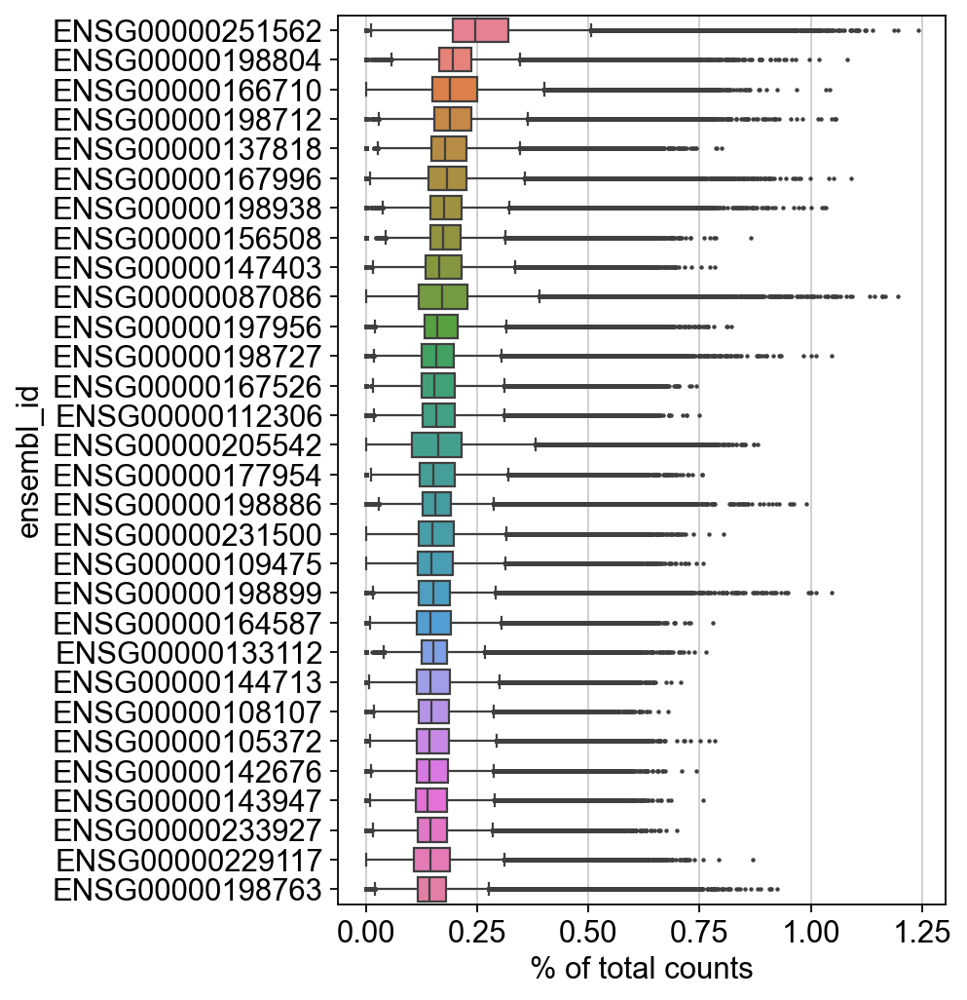

In [74]:
# Highly expressed genes for czi
sc.pl.highest_expr_genes(hlca, n_top=20)

##### Visualizing the data

A PCA analysis is run to determine the prinicple components that vary the most from one another. The idea is that PC1 has the highest variance or is the "most different" and PC2, PC3, etc are ranked lower in variance from there.

A UMAP visualization is a way of clustering multiple PCs in a 2-D space. While often helpful, keep in mind reducing high-dimensional data to 2 dimensions can easily leave information out.

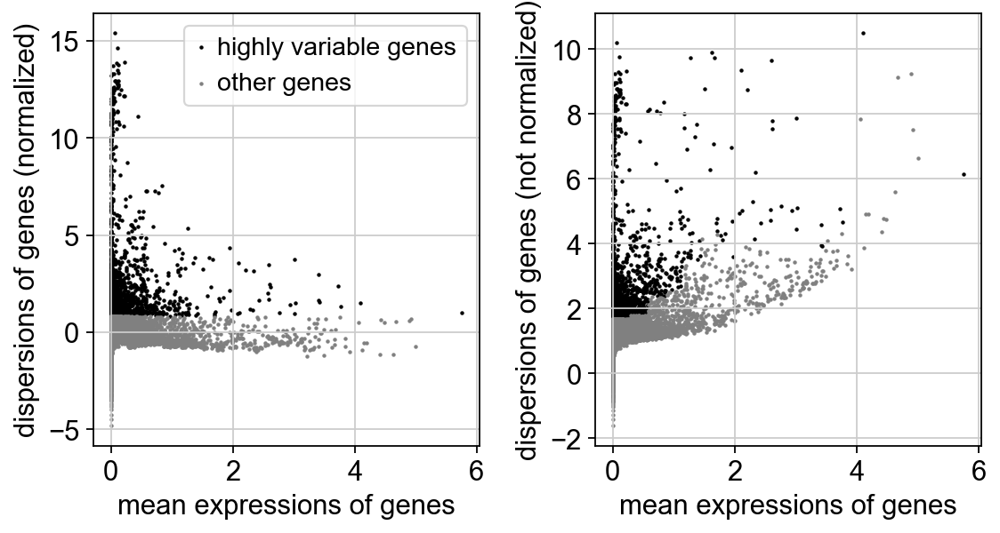

In [83]:
sc.pp.highly_variable_genes(hlca, n_top_genes=2000)
sc.pl.highly_variable_genes(hlca)

In [101]:
sc.pp.neighbors(hlca, n_neighbors=10, n_pcs=40)

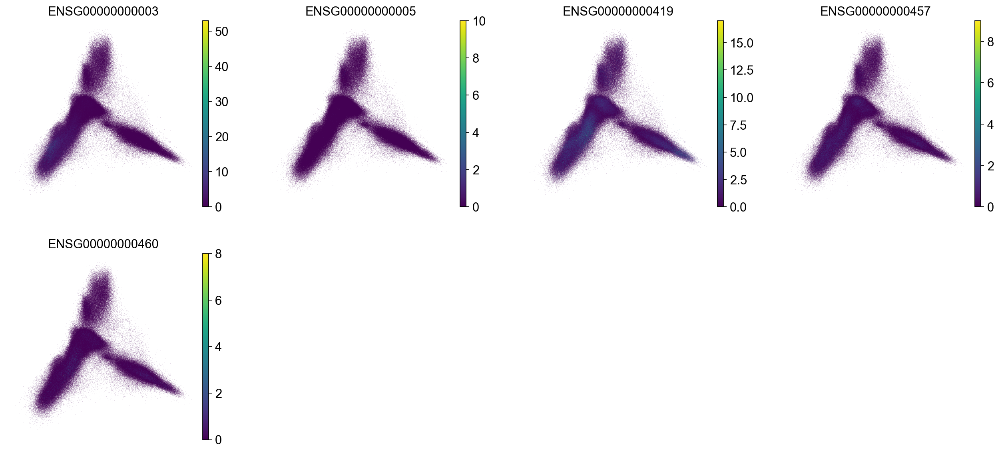

In [102]:
# PCA on CZI first 5 genes
sc.tl.pca(hlca, svd_solver="arpack")
sc.pl.pca(hlca, color=hlca.var_names[:5])

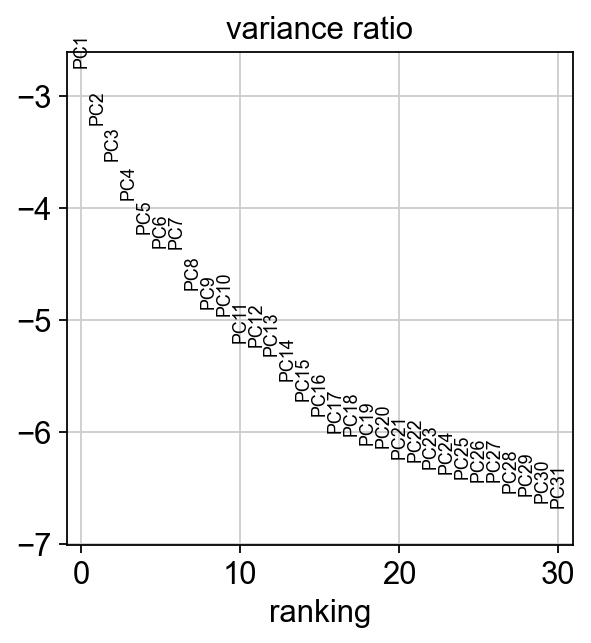

In [82]:
# Look at distribution of PCs
# Note: If you're using your own data, the distribution of PCs might look closer to a logarithmic distribution.
sc.pl.pca_variance_ratio(hlca, log=True)

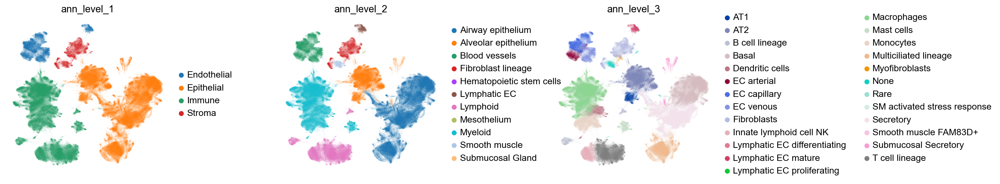

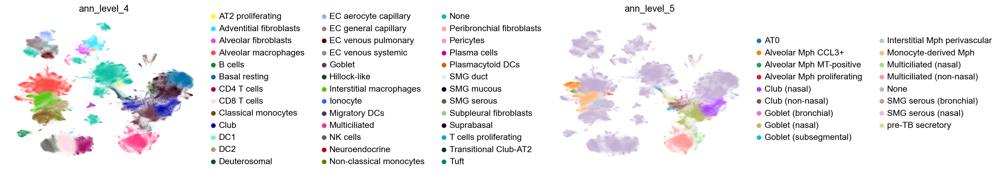

In [75]:
# UMAP of HLCA cell types at difference levels
sc.pl.umap(hlca, color=['ann_level_1', 'ann_level_2', 'ann_level_3'], wspace=.5)
sc.pl.umap(hlca, color=['ann_level_4', 'ann_level_5'], wspace=1.5)

# Notice the "None" category at levels 3 and up. Let's try to correct for that.

In [84]:
# To correct for the "None" category, we can reference the previous level's category to backfill the missing data.
df = hlca.obs.copy()
df['ann_level_3'] = df.apply(lambda x: x['ann_level_2'] if x['ann_level_3'] == 'None' else x['ann_level_3'], axis=1)
df['ann_level_4'] = df.apply(lambda x: x['ann_level_3'] if x['ann_level_4'] == 'None' else x['ann_level_4'], axis=1)
df['ann_level_5'] = df.apply(lambda x: x['ann_level_4'] if x['ann_level_5'] == 'None' else x['ann_level_5'], axis=1)
hlca.obs = df

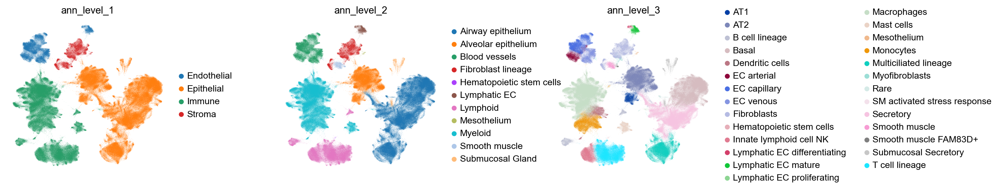

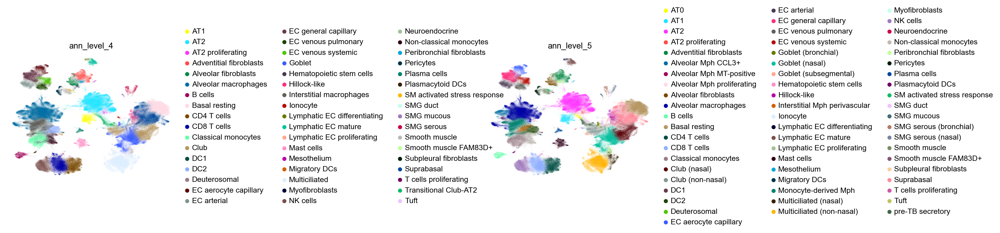

In [85]:
# Re-plot UMAP of HLCA cell types at difference levels
sc.pl.umap(hlca, color=['ann_level_1', 'ann_level_2', 'ann_level_3'], wspace=.5)
sc.pl.umap(hlca, color=['ann_level_4', 'ann_level_5'], wspace=1.5)

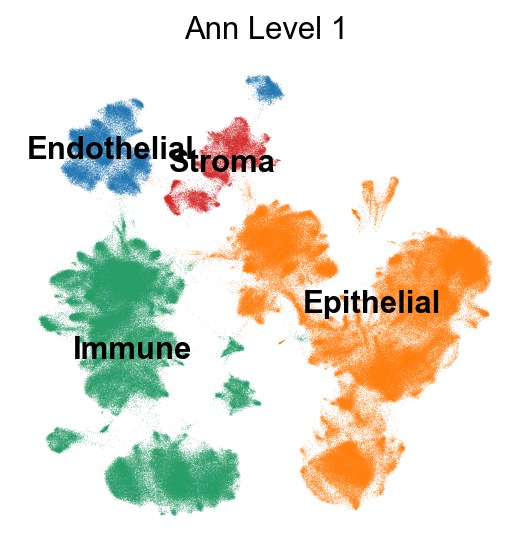

In [88]:
# To plot the names on the UMAP, use legend_loc='on data'
sc.pl.umap(hlca, color='ann_level_1', title='Ann Level 1', legend_loc='on data')

In [98]:
# To see where PC data is stored:
# https://scanpy.readthedocs.io/en/stable/generated/scanpy.tl.pca.html 
hlca.varm['PCs']


array([[-1.08271400e-02, -6.12701662e-03, -1.81520972e-02, ...,
        -1.37468067e-03,  8.03196244e-03,  7.32325390e-03],
       [-1.19448468e-05, -1.17579575e-07,  9.66892821e-06, ...,
        -3.55886150e-05, -1.74199395e-05,  9.78643366e-05],
       [ 1.95663236e-03, -5.46511356e-03, -1.85366895e-03, ...,
        -1.75547937e-03, -3.22749093e-03, -2.99271476e-03],
       ...,
       [-8.26378800e-06, -8.88124760e-06, -1.30123262e-05, ...,
        -1.28854333e-06, -2.51145957e-05,  1.02886270e-05],
       [ 9.90174200e-08,  3.84692885e-06,  2.32411503e-06, ...,
        -8.00842099e-06,  4.52897848e-06,  7.81229573e-06],
       [ 5.70194061e-07,  1.72806688e-06,  5.59753717e-05, ...,
        -3.58647703e-05,  2.05767174e-05, -1.07644664e-04]], dtype=float32)

In [99]:
# To see where PC data is stored:
# https://scanpy.readthedocs.io/en/stable/generated/scanpy.tl.pca.html 
hlca.obsm['X_pca']

array([[ 2.2690062e+01, -9.6370625e-01, -4.9130588e+00, ...,
         1.3485104e+00,  1.5062672e+00, -2.9909310e-01],
       [-3.3802574e+00,  7.5801463e+00,  1.5817315e+01, ...,
         2.0317685e-02,  4.0484270e-01, -1.2476408e+00],
       [-2.0540061e+00, -9.0136433e+00,  4.2838669e+00, ...,
        -1.8639754e+00,  4.7962487e-01,  1.1254865e+00],
       ...,
       [ 3.1363255e-01, -1.2008306e+01,  1.4545933e+00, ...,
        -9.7162831e-01, -5.6405836e-01, -2.1091601e-01],
       [-5.9902735e+00, -1.8736018e+00, -1.1763524e+01, ...,
         1.5223701e+00,  1.1908081e-01,  6.2395465e-01],
       [-1.0899843e+01,  1.3492014e+00, -5.9308410e+00, ...,
        -1.9157141e-01,  7.0655334e-01, -6.1285383e-01]], dtype=float32)

In [100]:
# To see where UMAP data is stored:
# https://scanpy.readthedocs.io/en/stable/generated/scanpy.tl.umap.html
hlca.obsm['X_umap']

array([[-0.7461761,  6.005713 ],
       [-2.8214977, -6.948418 ],
       [ 9.080318 ,  7.3863683],
       ...,
       [ 9.036422 ,  8.280477 ],
       [13.430364 ,  2.2283201],
       [13.87223  ,  2.0113256]], dtype=float32)

##### Filter genes with low expression

In [119]:
sum(hlca.obs['n_genes_detected'].value_counts() < 250)


8045

In [121]:
# Filter out where n_genes_detected is less than 250
hlca_cp = hlca[hlca.obs['n_genes_detected'] > 250, :]

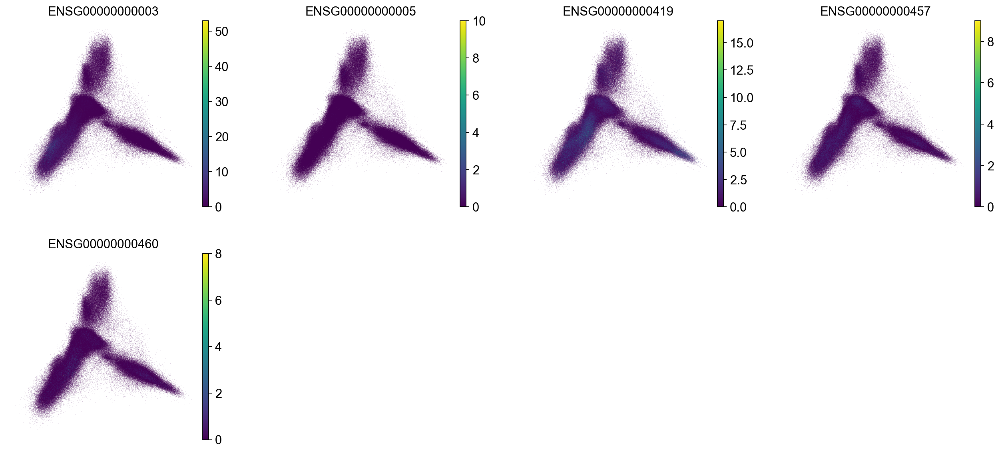

In [122]:
# Replot PCA
sc.pp.neighbors(hlca_cp, n_neighbors=10, n_pcs=40)
sc.tl.pca(hlca_cp, svd_solver="arpack")
sc.pl.pca(hlca_cp, color=hlca.var_names[:5])

##### Subset data by cell type & compare datasets

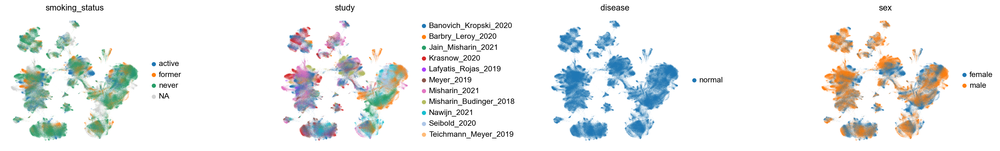

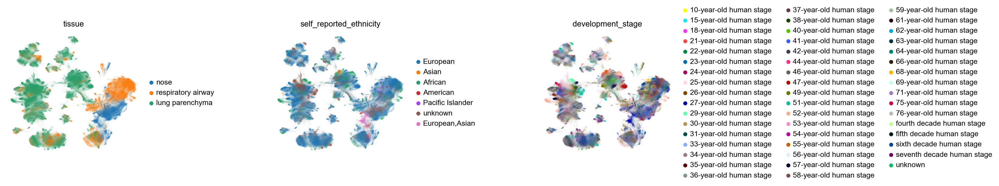

In [123]:
# Cluster by condition
# Look at conditions
meta_ls = [['smoking_status', 'study', 'disease','sex'],['tissue','self_reported_ethnicity','development_stage']]
for i in meta_ls:
    sc.pl.umap(hlca_cp, color=i, wspace=0.75)

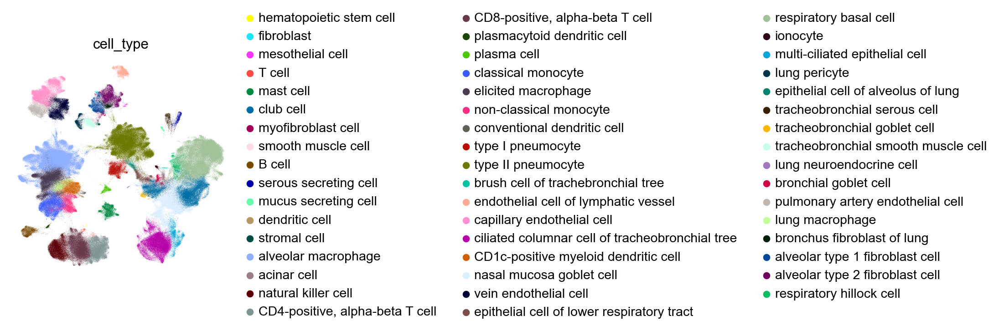

In [124]:
# Cluster by cell type and subset by cell type
# 1 - List all cell types
sc.pl.umap(hlca_cp, color='cell_type', wspace=0.75)


In [154]:
# Example of a physical list
hlca.obs.cell_type.unique().tolist()[:10]

['alveolar macrophage',
 'natural killer cell',
 'type II pneumocyte',
 'respiratory basal cell',
 'vein endothelial cell',
 'CD8-positive, alpha-beta T cell',
 'pulmonary artery endothelial cell',
 'bronchus fibroblast of lung',
 'CD4-positive, alpha-beta T cell',
 'type I pneumocyte']

In [150]:
# 2 - Choose a category or substring to filter by
# Example: Filter by "cyte"
hlca_cyte = hlca_cp[hlca_cp.obs['cell_type'].str.contains('cyte'), :]
hlca_cyte.shape

(100175, 28024)

In [151]:
hlca_cyte.obs['cell_type'].value_counts()

cell_type
type II pneumocyte        62313
classical monocyte        17641
non-classical monocyte     8832
type I pneumocyte          7797
lung pericyte              3031
ionocyte                    561
Name: count, dtype: int64

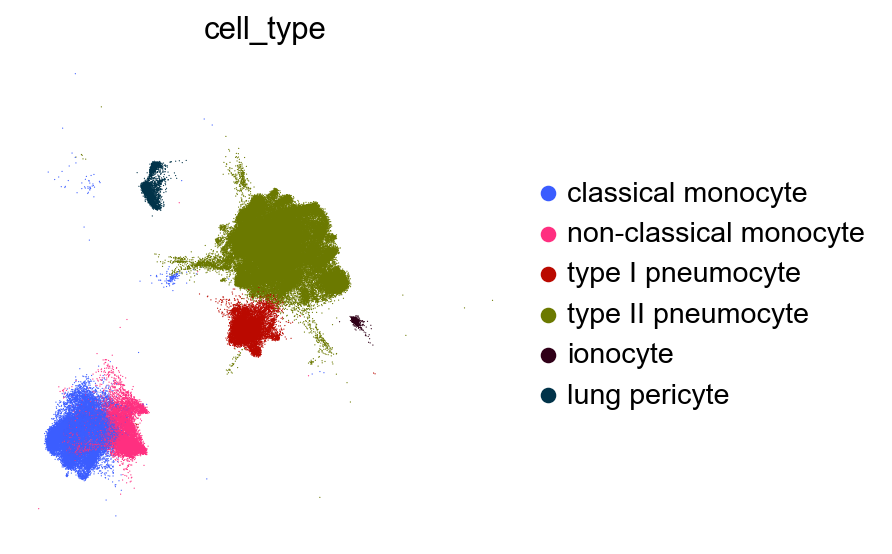

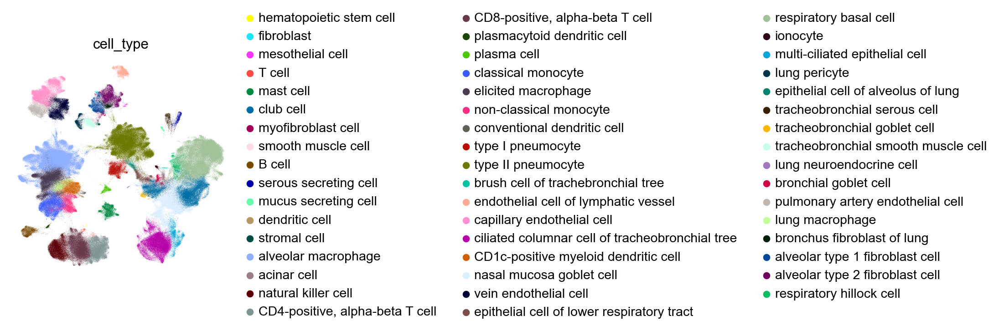

In [153]:
# 3 - Plot the subseted UMAP
sc.pl.umap(hlca_cyte, color='cell_type', wspace=0.75)
# 4 - Compare to whole UMAP - watch for possible changes in color
sc.pl.umap(hlca_cp, color='cell_type', wspace=0.75)